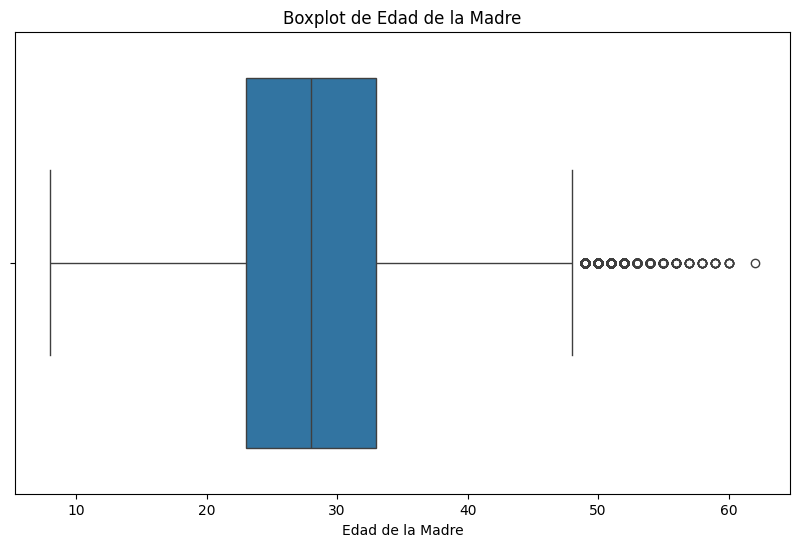

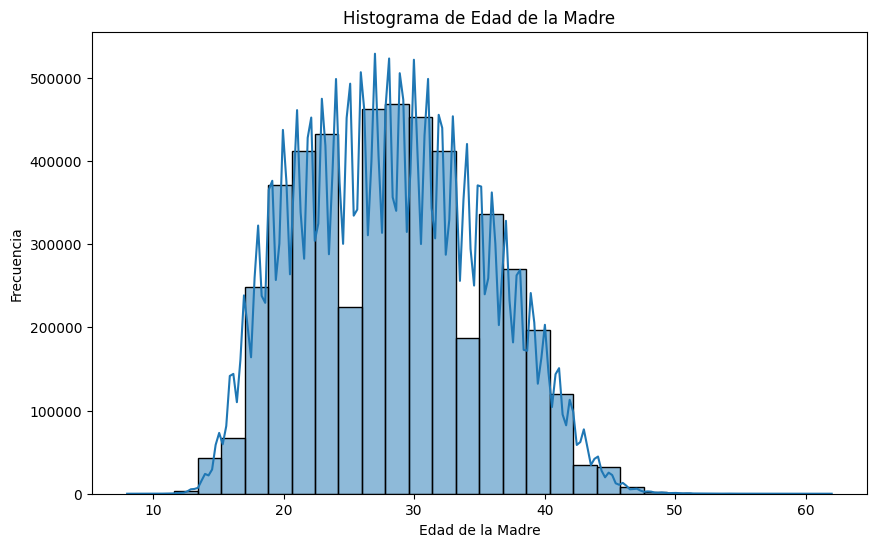

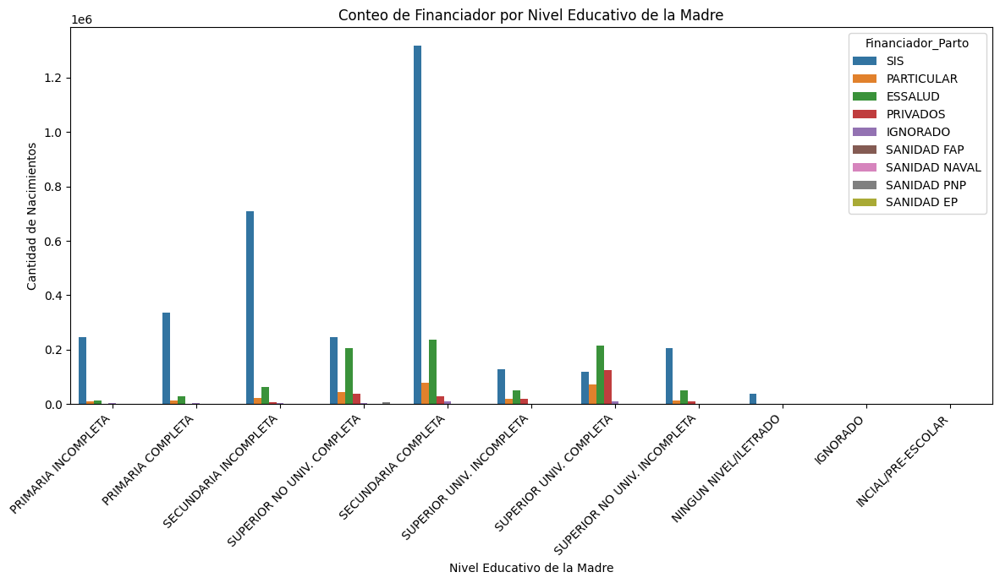

/tmp/ipython-input-3203979054.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


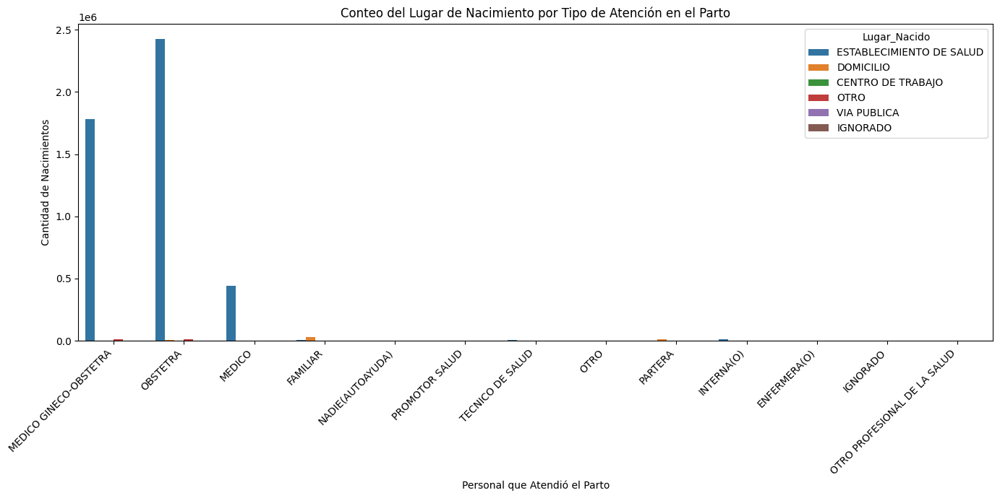

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cargar los datos
# Asegúrate de que la ruta y el nombre del archivo son correctos
df = pd.read_csv('/content/CNV_MINSA_4782338_CORTE_310825.csv', delimiter=';', on_bad_lines='skip')

# --- GRÁFICOS NUMÉRICOS (Estos ya estaban bien) ---

# Boxplot para Edad de la Madre
plt.figure(figsize=(10, 6))
# 'EDAD_MADRE' parece ser el nombre correcto según el contexto de ChatGPT
sns.boxplot(x=df['Edad_Madre'])
plt.title('Boxplot de Edad de la Madre')
plt.xlabel('Edad de la Madre')
plt.show()

# Histograma de Edad de la Madre
plt.figure(figsize=(10, 6))
sns.histplot(df['Edad_Madre'], kde=True, bins=30) # Aumenté los bins como sugirió ChatGPT
plt.title('Histograma de Edad de la Madre')
plt.xlabel('Edad de la Madre')
plt.ylabel('Frecuencia')
plt.show()


# --- GRÁFICOS CATEGÓRICOS (Aquí está la corrección) ---

# 1. Conteo de Financiador por Nivel Educativo de la Madre
plt.figure(figsize=(12, 7))
# Usamos countplot y el parámetro 'hue' para comparar la segunda variable
sns.countplot(data=df, x='Nivel_Intrucción_Madre', hue='Financiador_Parto')
plt.title('Conteo de Financiador por Nivel Educativo de la Madre')
plt.xlabel('Nivel Educativo de la Madre')
plt.ylabel('Cantidad de Nacimientos')
plt.xticks(rotation=45, ha='right') # ha='right' alinea mejor las etiquetas
plt.tight_layout() # Ajusta el gráfico para que no se corten las etiquetas
plt.show()

# 2. Conteo de Ocupación por Fuente de Financiamiento
plt.figure(figsize=(12, 7))
# 'DESC_OCUPACION' tiene muchas categorías, así que vamos a contar por financiador y usar la ocupación como 'hue'
# Nota: Si hay demasiadas ocupaciones, este gráfico puede ser difícil de leer.
sns.countplot(data=df, x='Financiador_Parto', hue='DESC_OCUPACION')
plt.title('Conteo de Ocupación de la Madre por Fuente de Financiamiento')
plt.xlabel('Fuente de Financiamiento del Parto')
plt.ylabel('Cantidad de Nacimientos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 3. Conteo del Lugar de Nacimiento por Tipo de Atención en el Parto
plt.figure(figsize=(14, 7))
sns.countplot(data=df, x='Atiende_Parto', hue='Lugar_Nacido')
plt.title('Conteo del Lugar de Nacimiento por Tipo de Atención en el Parto')
plt.xlabel('Personal que Atendió el Parto')
plt.ylabel('Cantidad de Nacimientos')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

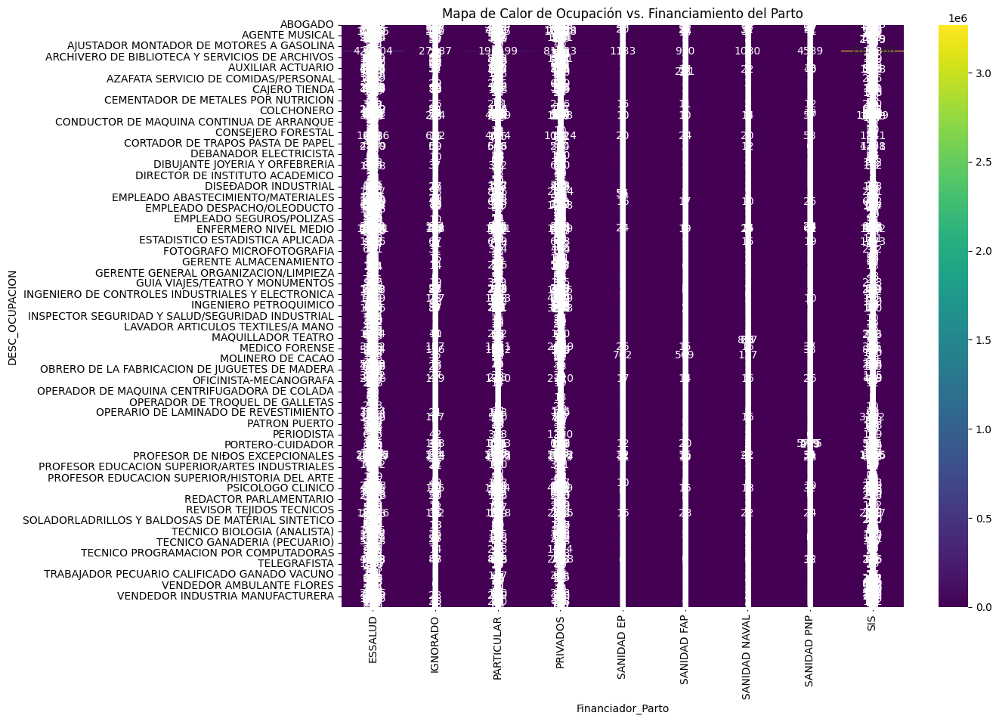

In [19]:
# Alternativa para la Ocupación vs. Financiamiento
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Crear una tabla de contingencia (crosstab)
contingency_table = pd.crosstab(df['DESC_OCUPACION'], df['Financiador_Parto'])

# Crear el mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='viridis') # annot=True muestra los números, fmt='d' los formatea como enteros
plt.title('Mapa de Calor de Ocupación vs. Financiamiento del Parto')
plt.show()

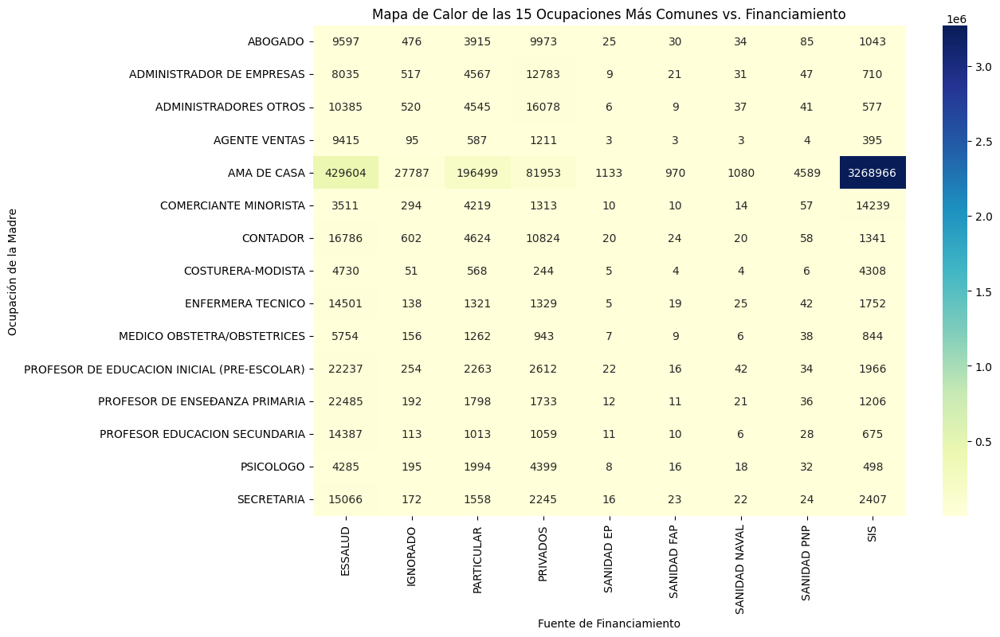

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Encontrar las 15 ocupaciones más comunes
top_ocupaciones = df['DESC_OCUPACION'].value_counts().nlargest(15).index

# 2. Crear un nuevo DataFrame que contenga SOLO las filas de esas 15 ocupaciones
df_filtrado = df[df['DESC_OCUPACION'].isin(top_ocupaciones)]

# 3. Crear la tabla de contingencia con el DataFrame filtrado
contingency_table_filtrada = pd.crosstab(df_filtrado['DESC_OCUPACION'], df_filtrado['Financiador_Parto'])

# 4. Crear el mapa de calor (¡ahora será legible!)
plt.figure(figsize=(12, 8))
sns.heatmap(
    contingency_table_filtrada,
    annot=True,          # Mostrar los números en las celdas
    fmt='d',             # Formato de número entero
    cmap='YlGnBu'        # Un mapa de color diferente y agradable a la vista
)
plt.title('Mapa de Calor de las 15 Ocupaciones Más Comunes vs. Financiamiento')
plt.xlabel('Fuente de Financiamiento')
plt.ylabel('Ocupación de la Madre')
plt.show()

Datos enriquecidos listos para el análisis.
   Edad_Madre  Es_Adolescente      Nivel_Intrucción_Madre  \
0          36           False         PRIMARIA INCOMPLETA   
1          35           False           PRIMARIA COMPLETA   
2          32           False         PRIMARIA INCOMPLETA   
3          34           False       SECUNDARIA INCOMPLETA   
4          33           False  SUPERIOR NO UNIV. COMPLETA   

   Bajo_Nivel_Educativo DEPARTAMENTO  
0                  True        PIURA  
1                  True  LA LIBERTAD  
2                  True        JUNIN  
3                  True  LA LIBERTAD  
4                 False       CALLAO  


/tmp/ipython-input-1887916118.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


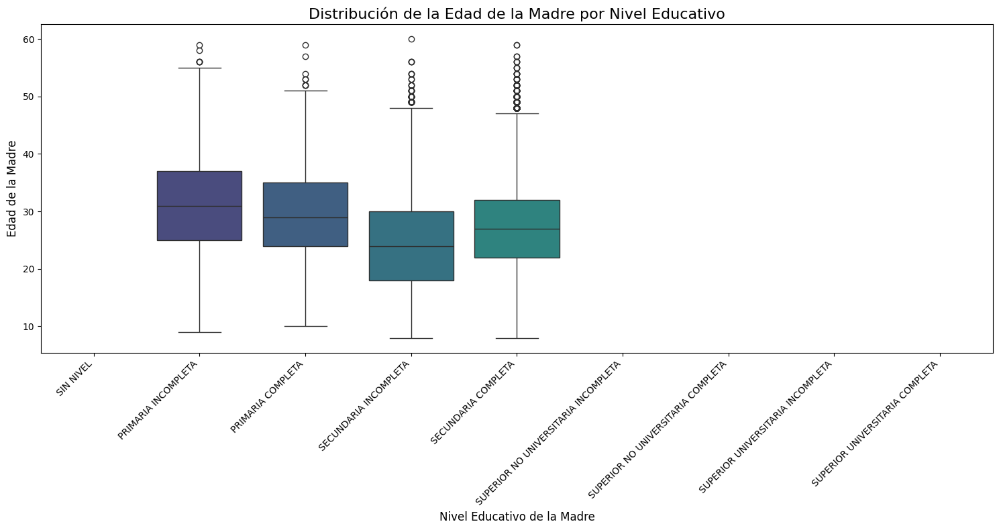

/tmp/ipython-input-1887916118.py:71: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


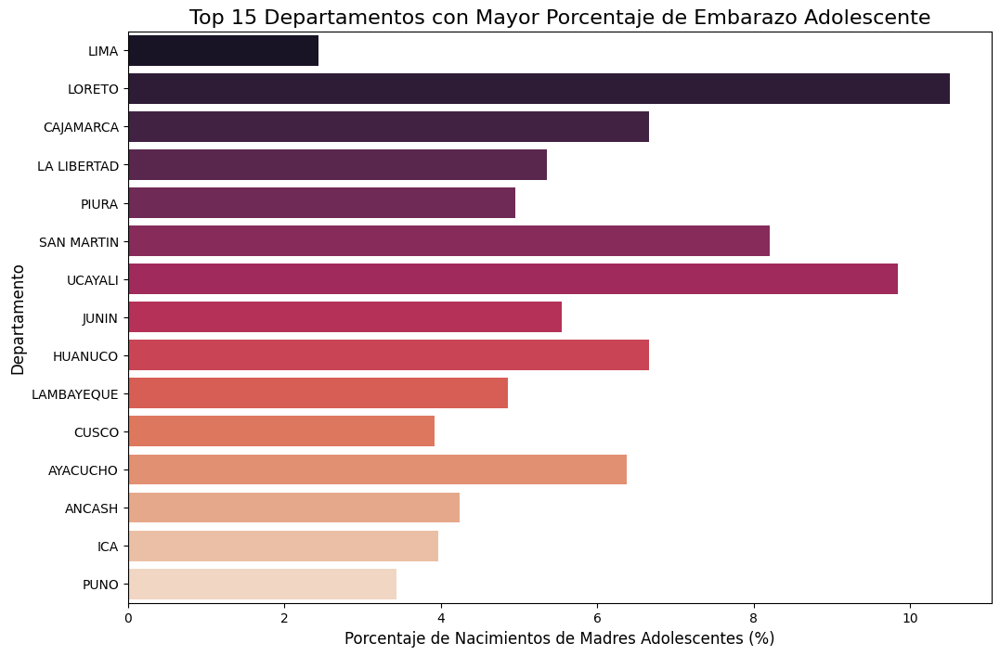

/tmp/ipython-input-1887916118.py:89: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


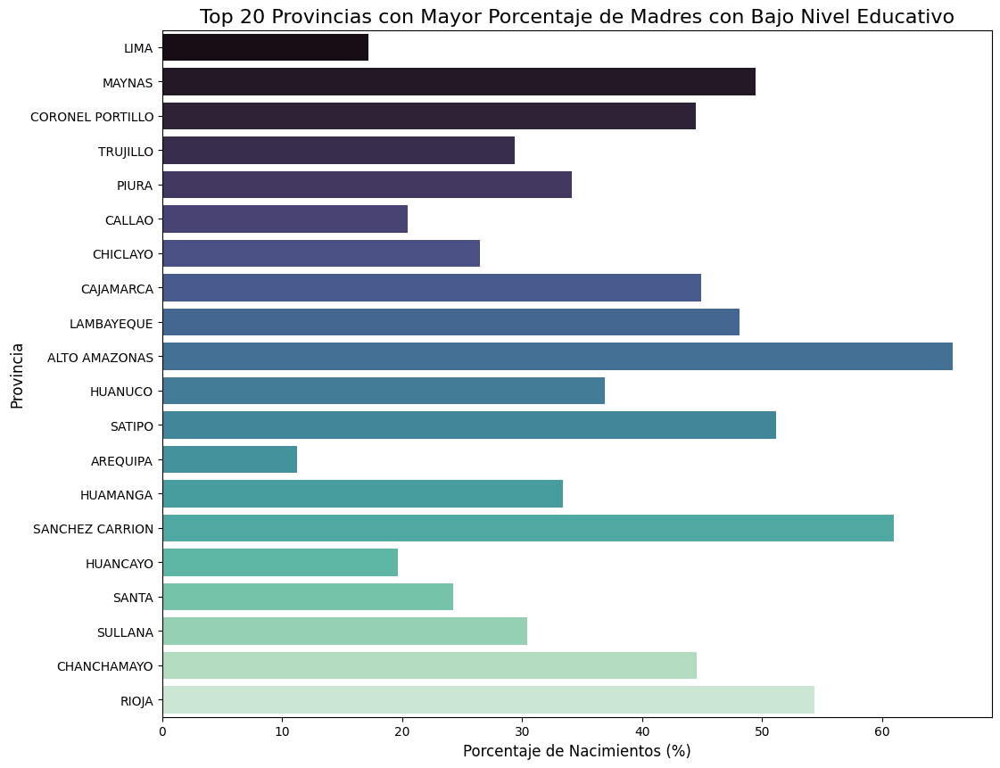

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Carga de Datos ---
df_nacimientos = pd.read_csv('/content/CNV_MINSA_4782338_CORTE_310825.csv', delimiter=';', on_bad_lines='skip')
df_ubigeos = pd.read_csv('/content/Lista_Ubigeos_INEI.csv', delimiter=';')

# --- Creación de Columnas de Interés ---

# 1. Identificar embarazo adolescente (ej. menores de 18 años)
# Se usa 'Edad_Madre' del diccionario.
df_nacimientos['Es_Adolescente'] = df_nacimientos['Edad_Madre'] < 18

# 2. Identificar bajo nivel educativo
niveles_bajos = ['SIN NIVEL', 'PRIMARIA INCOMPLETA', 'PRIMARIA COMPLETA', 'SECUNDARIA INCOMPLETA']
# CORRECCIÓN FINAL: Usamos 'Nivel_Intrucción_Madre' con "t", como indicaste.
df_nacimientos['Bajo_Nivel_Educativo'] = df_nacimientos['Nivel_Intrucción_Madre'].isin(niveles_bajos)


# --- Enriquecimiento Geográfico ---
df_nacimientos['IdUbigeoInei'] = pd.to_numeric(df_nacimientos['IdUbigeoInei'], errors='coerce')
df_ubigeos['UBIGEO_INEI'] = pd.to_numeric(df_ubigeos['UBIGEO_INEI'], errors='coerce')

# Unir los dataframes
df_completo = pd.merge(
    df_nacimientos,
    df_ubigeos,
    left_on='IdUbigeoInei',
    right_on='UBIGEO_INEI',
    how='left'
)

print("Datos enriquecidos listos para el análisis.")
# CORRECCIÓN FINAL: Usamos los nombres correctos en la impresión.
print(df_completo[['Edad_Madre', 'Es_Adolescente', 'Nivel_Intrucción_Madre', 'Bajo_Nivel_Educativo', 'DEPARTAMENTO']].head())

# --- Gráfico 1: Boxplot Edad vs. Nivel Educativo ---

orden_educativo = [
    'SIN NIVEL', 'PRIMARIA INCOMPLETA', 'PRIMARIA COMPLETA',
    'SECUNDARIA INCOMPLETA', 'SECUNDARIA COMPLETA',
    'SUPERIOR NO UNIVERSITARIA INCOMPLETA', 'SUPERIOR NO UNIVERSITARIA COMPLETA',
    'SUPERIOR UNIVERSITARIA INCOMPLETA', 'SUPERIOR UNIVERSITARIA COMPLETA'
]

plt.figure(figsize=(15, 8))
sns.boxplot(
    data=df_completo,
    # CORRECCIÓN FINAL: Usamos el nombre de columna correcto para el eje X.
    x='Nivel_Intrucción_Madre',
    y='Edad_Madre',
    order=orden_educativo,
    palette='viridis'
)
plt.title('Distribución de la Edad de la Madre por Nivel Educativo', fontsize=16)
plt.xlabel('Nivel Educativo de la Madre', fontsize=12)
plt.ylabel('Edad de la Madre', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# --- Gráfico 2: Ranking de Embarazo Adolescente por Departamento ---

casos_adolescentes = df_completo[df_completo['Es_Adolescente'] == True]
ranking_adolescentes = casos_adolescentes['DEPARTAMENTO'].value_counts().nlargest(15)
total_nacimientos_dep = df_completo['DEPARTAMENTO'].value_counts()
porcentaje_adolescentes = (ranking_adolescentes / total_nacimientos_dep.reindex(ranking_adolescentes.index).fillna(1)) * 100

plt.figure(figsize=(12, 8))
sns.barplot(
    x=porcentaje_adolescentes.values,
    y=porcentaje_adolescentes.index,
    palette='rocket'
)
plt.title('Top 15 Departamentos con Mayor Porcentaje de Embarazo Adolescente', fontsize=16)
plt.xlabel('Porcentaje de Nacimientos de Madres Adolescentes (%)', fontsize=12)
plt.ylabel('Departamento', fontsize=12)
plt.show()

# --- Gráfico 3: Ranking de Madres con Bajo Nivel Educativo por Provincia ---

casos_bajo_nivel = df_completo[df_completo['Bajo_Nivel_Educativo'] == True]
ranking_bajo_nivel = casos_bajo_nivel['PROVINCIA'].value_counts().nlargest(20)
total_nacimientos_prov = df_completo['PROVINCIA'].value_counts()
porcentaje_bajo_nivel = (ranking_bajo_nivel / total_nacimientos_prov.reindex(ranking_bajo_nivel.index).fillna(1)) * 100

plt.figure(figsize=(12, 10))
sns.barplot(
    x=porcentaje_bajo_nivel.values,
    y=porcentaje_bajo_nivel.index,
    palette='mako'
)
plt.title('Top 20 Provincias con Mayor Porcentaje de Madres con Bajo Nivel Educativo', fontsize=16)
plt.xlabel('Porcentaje de Nacimientos (%)', fontsize=12)
plt.ylabel('Provincia', fontsize=12)
plt.show()

--- 2. CARGANDO Y PREPARANDO DATOS ---
Dataset de nacimientos cargado con 4781957 registros.
Dataset de ubigeos cargado con 1892 registros.

--- 3. LIMPIEZA Y VALIDACIÓN DE DATOS ---
Registros antes de la validación de rangos: 4781957
Registros después de la validación de rangos: 4770089
Se eliminaron 11868 registros por estar fuera de rango.
Merge con datos geográficos completado.

--- 4. GENERANDO GRÁFICOS Y TABLAS DE ANÁLISIS EXPLORATORIO ---

Tabla 1: Resumen estadístico de variables clave
         Edad_Madre   PESO_NACIDO  TALLA_NACIDO  DUR_EMB_PARTO
count  4.770089e+06  4.770089e+06  4.770089e+06   4.770089e+06
mean   2.828761e+01  3.250210e+03  4.915958e+01   3.862900e+01
std    6.934501e+00  5.186103e+02  2.490624e+00   1.688696e+00
min    1.200000e+01  5.000000e+02  3.000000e+01   2.000000e+01
25%    2.300000e+01  2.970000e+03  4.800000e+01   3.800000e+01
50%    2.800000e+01  3.275000e+03  4.950000e+01   3.900000e+01
75%    3.300000e+01  3.580000e+03  5.050000e+01   4.000000e+

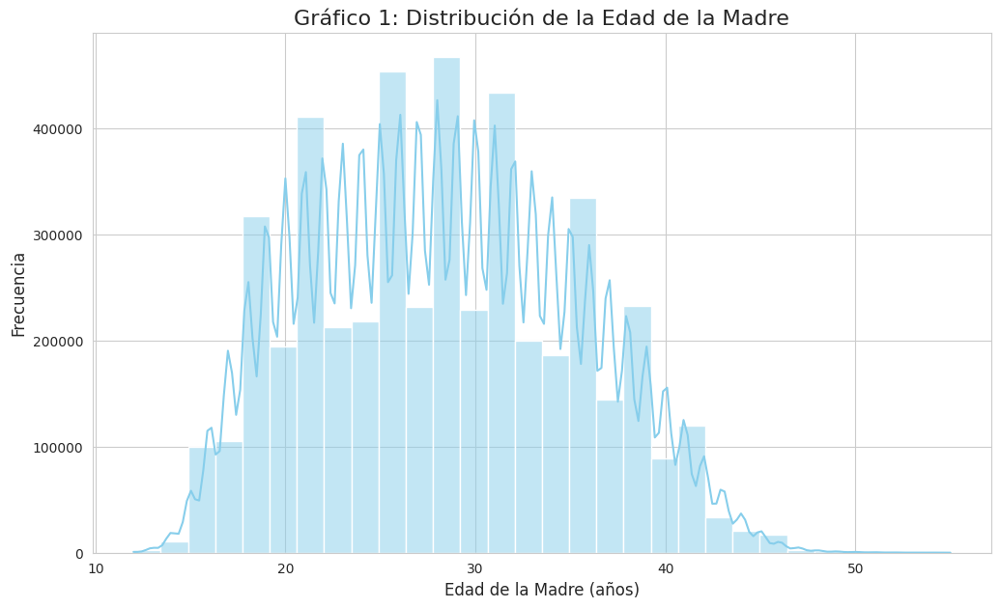

/tmp/ipython-input-1334690078.py:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df_completo['Nivel_Intrucción_Madre'], order=df_completo['Nivel_Intrucción_Madre'].value_counts().index, palette='viridis')


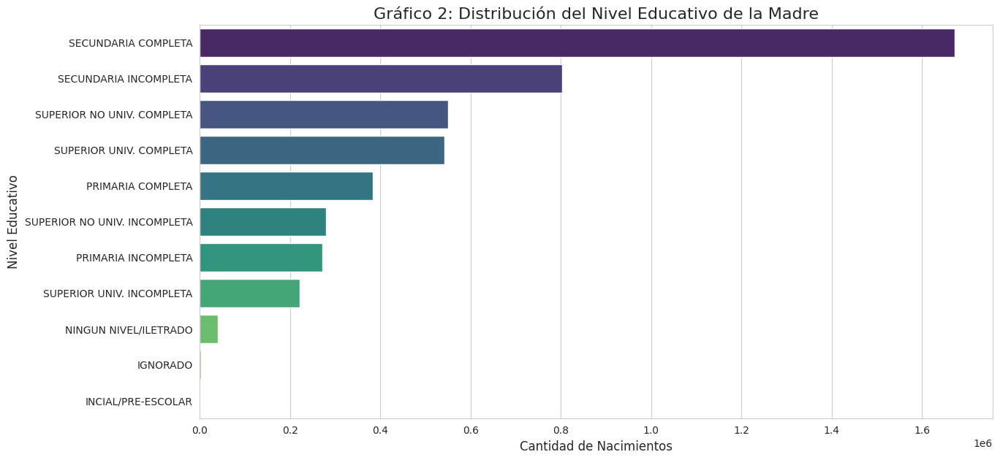

/tmp/ipython-input-1334690078.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_completo, x='Nivel_Intrucción_Madre', y='Edad_Madre', order=orden_educativo, palette='plasma')


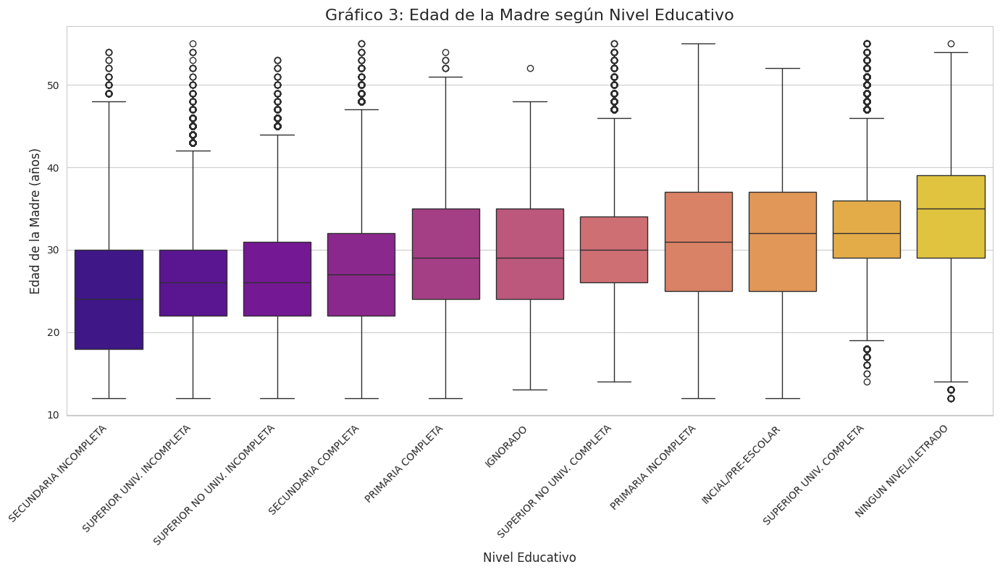


--- 5. TRANSFORMANDO DATOS: AGREGACIÓN TRIMESTRAL ---

Tabla 2: Muestra de los datos agregados por trimestre y departamento
   FecNac_Año  Trimestre DEPARTAMENTO  Nacimientos  Edad_Madre_Promedio  \
0        2015          1     AMAZONAS         1138            27.203866   
1        2015          1       ANCASH         2840            27.930282   
2        2015          1     APURIMAC         1559            27.639513   
3        2015          1     AREQUIPA         5512            29.171081   
4        2015          1     AYACUCHO         2850            28.005614   

  Nivel_Instruccion_Moda      Fecha  
0    SECUNDARIA COMPLETA 2015-03-01  
1    SECUNDARIA COMPLETA 2015-03-01  
2    SECUNDARIA COMPLETA 2015-03-01  
3    SECUNDARIA COMPLETA 2015-03-01  
4  SECUNDARIA INCOMPLETA 2015-03-01  

--- 6. GENERANDO GRÁFICOS DE TENDENCIAS Y COMPARATIVAS ---


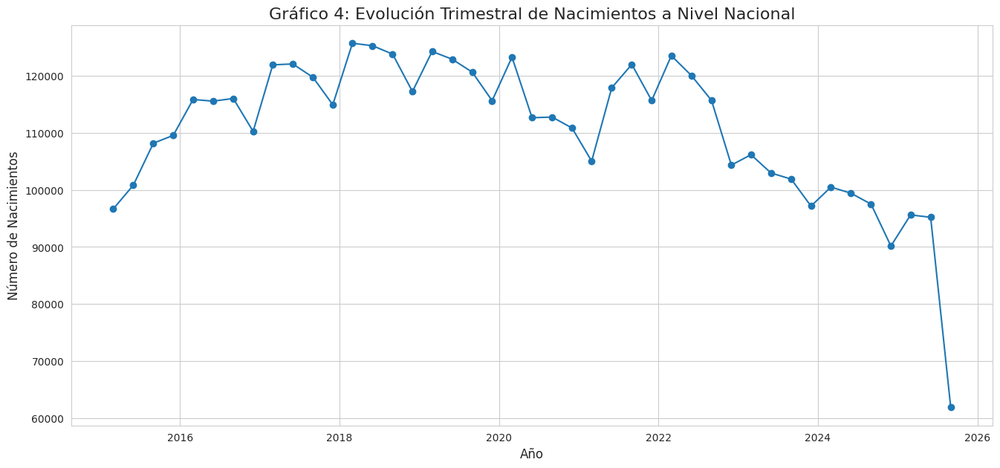


Tabla 3: Total de Nacimientos por Departamento y Año
FecNac_Año       2015    2016    2017    2018    2019    2020    2021    2022  \
DEPARTAMENTO                                                                    
AMAZONAS         4935    5577    5897    5664    5694    5102    5608    5649   
ANCASH          13786   15478   17233   18181   17738   17226   17004   17318   
APURIMAC         6681    7912    7928    7718    7273    7223    7334    7629   
AREQUIPA        21789   21428   21373   21197   20458   20350   17363   18395   
AYACUCHO        11537   11987   12282   11828   11692   11483   11612   10991   
CAJAMARCA       16655   19494   20642   20515   20316   18880   22309   23112   
CALLAO          14544   14523   15650   17541   16887   15937   13976   13545   
CUSCO           20659   21540   22619   22588   22059   21457   20015   20002   
HUANCAVELICA     7139    7680    7786    7643    7342    7153    7588    6976   
HUANUCO         13780   14580   15709   15574   15310  

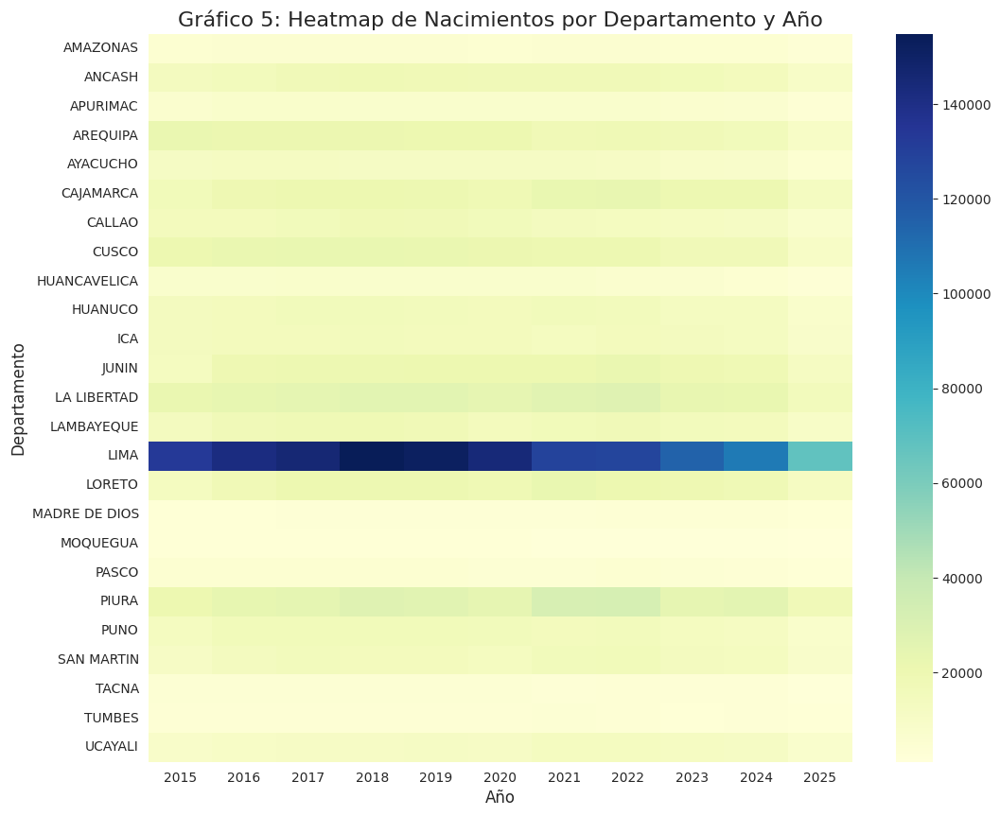

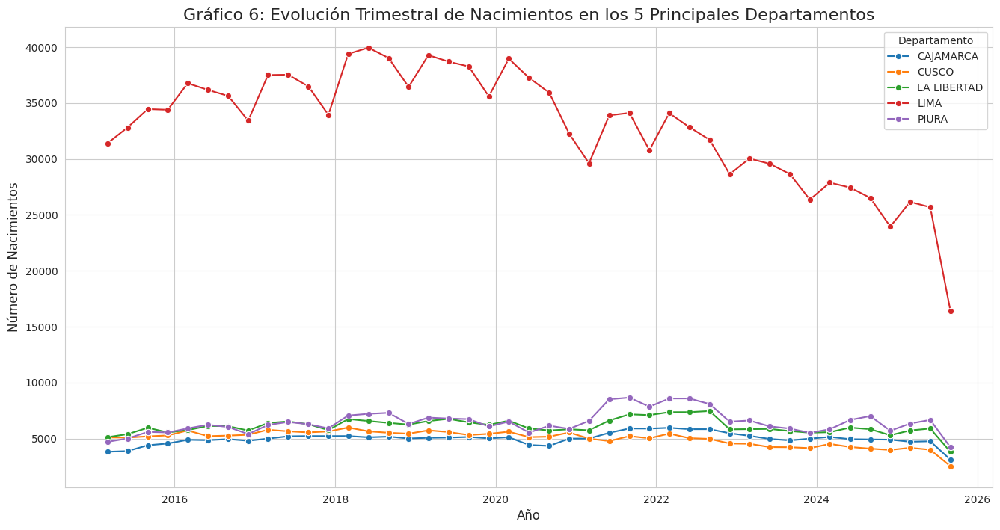


--- ANÁLISIS PRELIMINAR COMPLETADO ---


In [3]:
# ==============================================================================
# 1. IMPORTACIÓN DE LIBRERÍAS Y CONFIGURACIÓN
# ==============================================================================
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Configuración de estilo para los gráficos
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 12


# ==============================================================================
# 2. CARGA Y PREPARACIÓN INICIAL DE DATOS
# ==============================================================================
print("--- 2. CARGANDO Y PREPARANDO DATOS ---")
# Carga de los datasets
df_nacimientos = pd.read_csv('/content/CNV_MINSA_4782338_CORTE_310825.csv', delimiter=';', on_bad_lines='skip', low_memory=False)
df_ubigeos = pd.read_csv('/content/Lista_Ubigeos_INEI.csv', delimiter=';')

print(f"Dataset de nacimientos cargado con {df_nacimientos.shape[0]} registros.")
print(f"Dataset de ubigeos cargado con {df_ubigeos.shape[0]} registros.")


# ==============================================================================
# 3. LIMPIEZA Y VALIDACIÓN DE DATOS (CRISP-DM)
# ==============================================================================
print("\n--- 3. LIMPIEZA Y VALIDACIÓN DE DATOS ---")

# 3.1. Validación de rangos biológicamente posibles
registros_iniciales = len(df_nacimientos)
print(f"Registros antes de la validación de rangos: {registros_iniciales}")

df_nacimientos = df_nacimientos[(df_nacimientos['Edad_Madre'] >= 12) & (df_nacimientos['Edad_Madre'] <= 55)]
df_nacimientos = df_nacimientos[(df_nacimientos['PESO_NACIDO'] >= 500) & (df_nacimientos['PESO_NACIDO'] <= 5000)]
df_nacimientos = df_nacimientos[(df_nacimientos['TALLA_NACIDO'] >= 30) & (df_nacimientos['TALLA_NACIDO'] <= 60)]
df_nacimientos = df_nacimientos[(df_nacimientos['DUR_EMB_PARTO'] >= 20) & (df_nacimientos['DUR_EMB_PARTO'] <= 45)]

registros_finales = len(df_nacimientos)
print(f"Registros después de la validación de rangos: {registros_finales}")
print(f"Se eliminaron {registros_iniciales - registros_finales} registros por estar fuera de rango.")

# 3.2. Enriquecimiento Geográfico
# Asegurar que las columnas de unión sean numéricas
df_nacimientos['IdUbigeoInei'] = pd.to_numeric(df_nacimientos['IdUbigeoInei'], errors='coerce')
df_ubigeos['UBIGEO_INEI'] = pd.to_numeric(df_ubigeos['UBIGEO_INEI'], errors='coerce')
df_nacimientos.dropna(subset=['IdUbigeoInei'], inplace=True) # Eliminar filas donde la clave es nula

# Unir los dataframes
df_completo = pd.merge(
    df_nacimientos,
    df_ubigeos,
    left_on='IdUbigeoInei',
    right_on='UBIGEO_INEI',
    how='left'
)
print("Merge con datos geográficos completado.")


# ==============================================================================
# 4. ANÁLISIS EXPLORATORIO DE DATOS (EDA)
# ==============================================================================
print("\n--- 4. GENERANDO GRÁFICOS Y TABLAS DE ANÁLISIS EXPLORATORIO ---")

# 4.1. Tabla resumen de variables numéricas clave
print("\nTabla 1: Resumen estadístico de variables clave")
variables_numericas = ['Edad_Madre', 'PESO_NACIDO', 'TALLA_NACIDO', 'DUR_EMB_PARTO', 'Hijos_vivo_madre']
print(df_completo[variables_numericas].describe())

# 4.2. Gráfico de Distribución de Edad Materna
plt.figure(figsize=(12, 7))
sns.histplot(df_completo['Edad_Madre'], kde=True, bins=30, color='skyblue')
plt.title('Gráfico 1: Distribución de la Edad de la Madre')
plt.xlabel('Edad de la Madre (años)')
plt.ylabel('Frecuencia')
plt.show()

# 4.3. Gráfico de Distribución de Nivel Educativo
plt.figure(figsize=(14, 7))
sns.countplot(y=df_completo['Nivel_Intrucción_Madre'], order=df_completo['Nivel_Intrucción_Madre'].value_counts().index, palette='viridis')
plt.title('Gráfico 2: Distribución del Nivel Educativo de la Madre')
plt.xlabel('Cantidad de Nacimientos')
plt.ylabel('Nivel Educativo')
plt.show()

# 4.4. Gráfico de Relación Edad vs. Nivel Educativo
orden_educativo = df_completo.groupby('Nivel_Intrucción_Madre')['Edad_Madre'].mean().sort_values().index
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_completo, x='Nivel_Intrucción_Madre', y='Edad_Madre', order=orden_educativo, palette='plasma')
plt.title('Gráfico 3: Edad de la Madre según Nivel Educativo')
plt.xlabel('Nivel Educativo')
plt.ylabel('Edad de la Madre (años)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


# ==============================================================================
# 5. TRANSFORMACIÓN DE DATOS: AGREGACIÓN TRIMESTRAL
# ==============================================================================
print("\n--- 5. TRANSFORMANDO DATOS: AGREGACIÓN TRIMESTRAL ---")

# 5.1. Creación de la variable Trimestre
df_completo['Trimestre'] = pd.to_datetime(df_completo['FecNac_Mes'], format='%m').dt.quarter

# 5.2. Agregación
# Nota: El 'mode' puede devolver varios valores si hay empate, tomamos el primero.
datos_trimestrales = df_completo.groupby(['FecNac_Año', 'Trimestre', 'DEPARTAMENTO']).agg(
    Nacimientos=('FecNac_Año', 'count'),
    Edad_Madre_Promedio=('Edad_Madre', 'mean'),
    Nivel_Instruccion_Moda=('Nivel_Intrucción_Madre', lambda x: x.mode()[0])
).reset_index()

# 5.3. Creación de una columna de fecha para series temporales
datos_trimestrales['Fecha'] = pd.to_datetime(datos_trimestrales['FecNac_Año'].astype(str) + '-' + (datos_trimestrales['Trimestre'] * 3).astype(str))

print("\nTabla 2: Muestra de los datos agregados por trimestre y departamento")
print(datos_trimestrales.head())


# ==============================================================================
# 6. VISUALIZACIÓN DE DATOS AGREGADOS Y TENDENCIAS
# ==============================================================================
print("\n--- 6. GENERANDO GRÁFICOS DE TENDENCIAS Y COMPARATIVAS ---")

# 6.1. Gráfico de Serie Temporal de Nacimientos a Nivel Nacional
nacimientos_nacional = datos_trimestrales.groupby('Fecha')['Nacimientos'].sum().reset_index()
plt.figure(figsize=(16, 7))
plt.plot(nacimientos_nacional['Fecha'], nacimientos_nacional['Nacimientos'], marker='o', linestyle='-')
plt.title('Gráfico 4: Evolución Trimestral de Nacimientos a Nivel Nacional')
plt.xlabel('Año')
plt.ylabel('Número de Nacimientos')
plt.show()

# 6.2. Tabla de Nacimientos por Departamento y Año
pivot_nacimientos = datos_trimestrales.pivot_table(
    index='DEPARTAMENTO',
    columns='FecNac_Año',
    values='Nacimientos',
    aggfunc='sum',
    fill_value=0
)
print("\nTabla 3: Total de Nacimientos por Departamento y Año")
print(pivot_nacimientos)

# 6.3. Gráfico Heatmap de Nacimientos por Departamento y Año
plt.figure(figsize=(12, 10))
sns.heatmap(pivot_nacimientos, cmap='YlGnBu', annot=False, fmt=".0f")
plt.title('Gráfico 5: Heatmap de Nacimientos por Departamento y Año')
plt.xlabel('Año')
plt.ylabel('Departamento')
plt.show()

# 6.4. Gráfico de Serie Temporal por Departamentos Principales
top_departamentos = df_completo['DEPARTAMENTO'].value_counts().nlargest(5).index
datos_top_deptos = datos_trimestrales[datos_trimestrales['DEPARTAMENTO'].isin(top_departamentos)]

plt.figure(figsize=(16, 8))
sns.lineplot(data=datos_top_deptos, x='Fecha', y='Nacimientos', hue='DEPARTAMENTO', marker='o')
plt.title('Gráfico 6: Evolución Trimestral de Nacimientos en los 5 Principales Departamentos')
plt.xlabel('Año')
plt.ylabel('Número de Nacimientos')
plt.legend(title='Departamento')
plt.show()

print("\n--- ANÁLISIS PRELIMINAR COMPLETADO ---")